<a href="https://colab.research.google.com/github/IrfanKhalid/ForexExchangePrediction/blob/master/LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly as py
from plotly import tools
import datetime
import warnings
from sklearn.linear_model import LinearRegression
from scipy.optimize import OptimizeWarning
import scipy.optimize
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM,Activation,Flatten,BatchNormalization
from keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import ModelCheckpoint
import time
from sklearn import preprocessing
from collections import deque
from keras import optimizers
py.offline.init_notebook_mode(connected=True)
 

In [0]:
batch_size = 32
SEQ_LEN = 60  # how long of a preceeding sequence to collect for RNN
FUTURE_PERIOD_PREDICT = 3  # how far into the future are we trying to predict?

In [5]:

from google.colab import files
files.upload()

Saving EURUSD.csv to EURUSD.csv


{'EURUSD.csv': b'Gmt time,Open,High,Low,Close,Volume\r\n01.01.2016 00:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 01:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 02:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 03:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 04:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 05:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 06:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 07:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 08:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 09:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 10:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 11:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 12:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 13:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 14:00:00.000,1.08564,1.08564,1.08564,1.08564,0\r\n01.01.2016 15:00:00.000,1.085

In [0]:
df =  pd.read_csv("EURUSD.csv")
df.columns = ['Date','Open','High','Low','Close','Volume']
df.Date = pd.to_datetime(df.Date, format ='%d.%m.%Y %H:%M:%S.%f',errors='ignore')
df1 = df
df = df.set_index(df.Date)
df = df[['Open','High','Low','Close','Volume']]
df = df.drop_duplicates(keep=False)

In [7]:
df.head()

,Open,High,Low,Close,Volume
Date,,,,,
2016-01-03 22:00:00,1.08730,1.08730,1.08659,1.08666,1485.9301
2016-01-03 23:00:00,1.08665,1.08665,1.08451,1.08516,4071.6499
2016-01-04 00:00:00,1.08515,1.08577,1.08431,1.08453,4182.2402
2016-01-04 01:00:00,1.08453,1.08616,1.08272,1.08599,6970.7100
2016-01-04 02:00:00,1.08597,1.08756,1.08582,1.08714,6419.8901


In [0]:
def boolinger(df1 , days ):
    Movinavg = df1['Close'].rolling(days).mean()
    std = df1['Close'].rolling(days).std()
    upper = Movinavg + (std*2)
    lower = Movinavg - (std*2)
    return(upper,lower ,Movinavg )
upper,lower, avg = boolinger(df1 , 30)

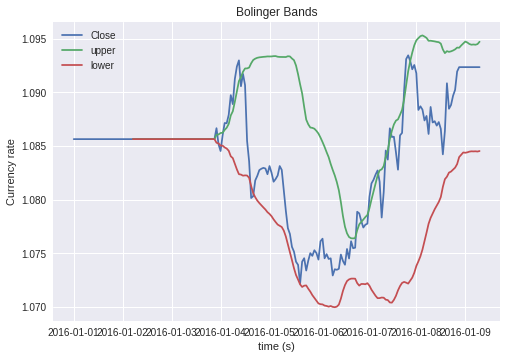

In [9]:
plt.plot(df1.Date[0:200],df1.Close[0:200],label = 'Close')
plt.plot(df1.Date[0:200],upper[0:200],label = 'upper')
plt.plot(df1.Date[0:200],lower[0:200],label = 'lower')
plt.xlabel('time (s)')
plt.ylabel('Currency rate')
plt.title('Bolinger Bands')
plt.legend()
plt.figure(figsize=(10,5))
plt.show()

In [11]:
py.offline.init_notebook_mode(connected=True)
y1 = go.Ohlc(x=df1.Date[0:500],open=df1.Open[0:500],high=df1.High[0:500],low=df1.Low[0:500],close=df1.Close[0:500],name='currency')
data=y1
fig = tools.make_subplots(rows=1,cols=1,shared_xaxes = True,shared_yaxes = True)
fig.append_trace(y1,1,1)
py.offline.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]



## Heikin-Ashi technique 
**Meaning "average bar" in Japanese – can be used in conjunction with candlestick charts to spot trends and to predict future prices.**

In [0]:
class holder:
    1
def highkenashi(prices,periods):
        results = holder()
        dict = {}
        HAclose = prices[['Open','High','Low','Close']].sum(axis=1)/4
        HAopen = HAclose.copy()
        HAopen.iloc[0] = HAclose.iloc[0]
        HAhigh = HAclose.copy()
        HAlow = HAclose.copy()
        
        for i in range(1,len(prices)):
            HAopen.iloc[i] = (HAopen.iloc[i-1] + HAclose.iloc[i-1])/2
            HAhigh.iloc[i] = np.array([prices.High.iloc[i],HAopen.iloc[i],HAclose.iloc[i]]).max()
            HAlow.iloc[i] = np.array([prices.Low.iloc[i],HAopen.iloc[i],HAclose.iloc[i]]).min()        
            
        a = {'Open' : HAopen,'High' : HAhigh, 'Low' : HAlow, 'Close' : HAclose}
        df2 = pd.DataFrame(data=a)
        #df.columns = [['open','high','low','close']]
        #dict[periods[0]] = df
        
        #results.candles = dict
        
        return df2#results

In [0]:
#HAresults = highkenashi(df1,[1])
#HA =  HAresults.candles[1]
#HA = highkenashi(df,[5])
#print(HA.head())
#print(df.head())

In [14]:
HA = highkenashi(df,[5])
df3 = df.iloc[200:250]
HA2 = HA.iloc[200:250]
y1 = go.Ohlc(x=df3.index,open=df3.Open,high=df3.High,low=df3.Low,close=df3.Close,name='currency')
y2 = go.Ohlc(x=HA2.index,open=HA2.Open,high=HA2.High,low=HA2.Low,close=HA2.Close,name='Highkanashi')
data=[y2]
fig = tools.make_subplots(rows=2,cols=1,shared_xaxes = True,shared_yaxes = True)
fig.append_trace(y1,1,1)
fig.append_trace(y2,2,1)
py.offline.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]



## Fit Fourier Tranform
**To fit fourier transform we need to remove trends from market to remove trends we are using two techniques a linear detrender and a difference detrender.**

In [0]:
def detrend(prices,method='difference'):
    if method == 'difference':
        detrended = prices.Close[1:] - prices.Close[:-1].values
    if method == 'linear':
        x = np.arange(0,len(prices))
        y = prices.Close.values
        
        Model = LinearRegression()
        Model.fit(x.reshape(-1,1),y.reshape(-1,1))
        trends = Model.predict(x.reshape(-1,1))
        trend = trends.reshape((len(prices),))
        detrended = prices.Close - trend
    return detrended

In [0]:
df3 = df.iloc[:200]
X1 =  detrend(df3)
X2 =  detrend(df3,'linear')

In [17]:
y1 = go.Ohlc(x=df3.index,open=df3.Open,high=df3.High,low=df3.Low,close=df3.Close,name='currency')
y2 = go.Scatter(x=df3.index,y=X1)
y3 = go.Scatter(x=df3.index,y=X2)
fig = tools.make_subplots(rows=3,cols=1,shared_xaxes = True,shared_yaxes = True)
fig.append_trace(y1,1,1)
fig.append_trace(y2,2,1)
fig.append_trace(y3,3,1)
py.offline.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



<h1><center>Fourier transform</center>
<center>Give x in hours we need to find ao a1 and b1 to predict next hour value</center></h1>
<img src = "Capture.JPG">

In [0]:
def fseries(x,a0,a1,b1,w):
    f = a0 + a1*np.cos(w*x) +b1*np.sin(w*x)
    return f
def sseries(x,a0,b1,w):
    f = a0 + b1*np.sin(w*x)
    return f
def fourier(prices,period,method='difference'):
    result = holder()
    dict = {}
    plot = True
    detrended = detrend(prices,method)
    for i in range(0,len(period)):
        coeffs = []
        for j in range(period[i],len(prices)):#-period[i]):
            x=np.arange(0,period[i])
            y = detrended.iloc[j-period[i]:j]
            with warnings.catch_warnings():
                warnings.simplefilter('error',OptimizeWarning)
                try:
                    res = scipy.optimize.curve_fit(fseries,x,y)
                except(RuntimeError,OptimizeWarning):
                    res = np.empty((1,4))
                    res[0:] = np.NAN
            if plot == True:
                xt=np.linspace(0,period[i],100)
                yt=fseries(xt,res[0][0],res[0][1],res[0][2],res[0][3])
                plt.plot(xt,yt)
                plt.plot(x,y)
                plt.show()
            coeffs = np.append(coeffs,res[0],axis=0)
        warnings.filterwarnings('ignore',category=np.VisibleDeprecationWarning)
        coeffs = np.array(coeffs).reshape(((int(len(coeffs)/4),4)))
        #print(prices.iloc[period[i]:-period[i]],'\n------\n')
        df= pd.DataFrame(coeffs,index=prices.iloc[period[i]:len(prices)].index)
        df.columns = [['ao','a1','b1','w']]
        df = df.fillna(method='bfill')
        df = df.fillna(method='ffill')
        dict[period[i]]=df
    result.coeff = dict
    return result

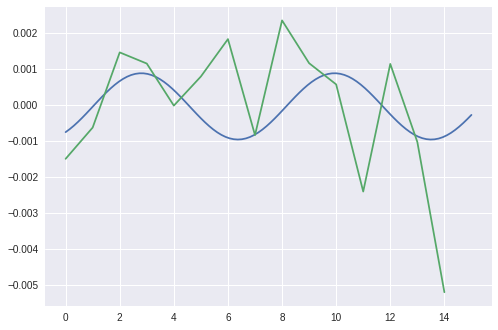

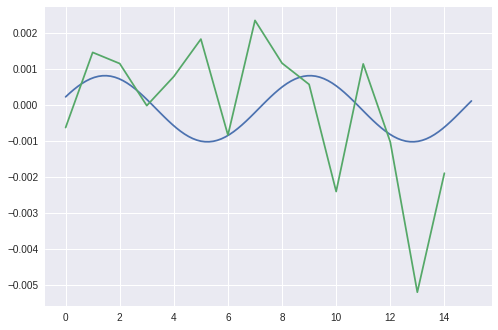

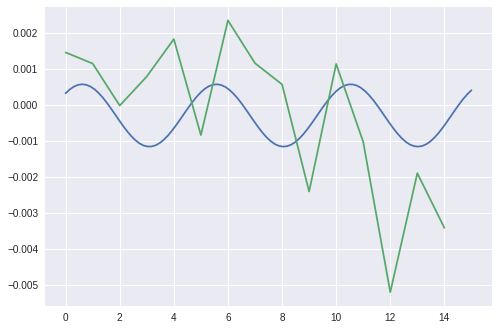

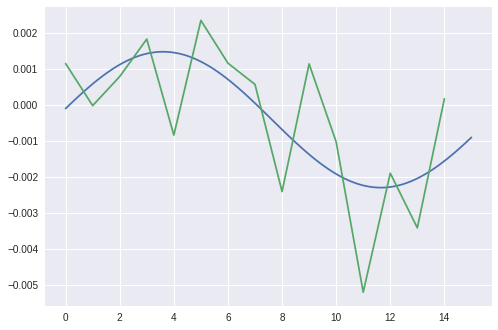

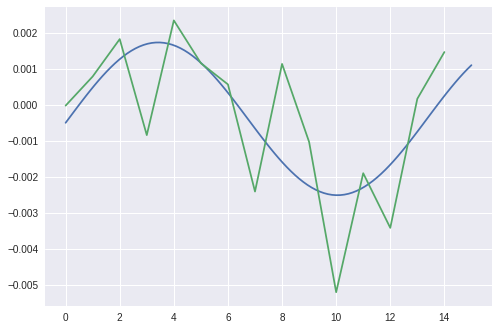

...

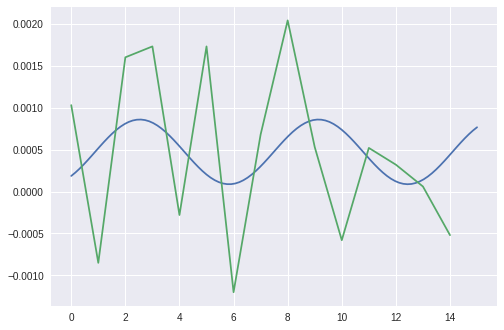

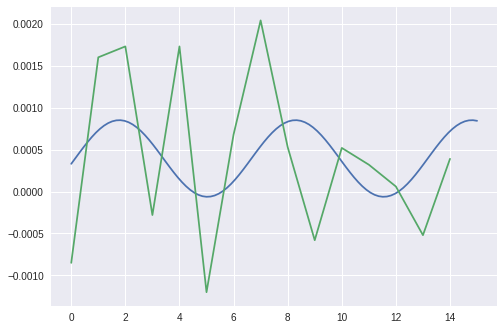

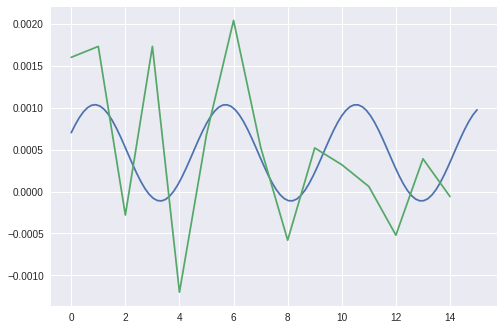

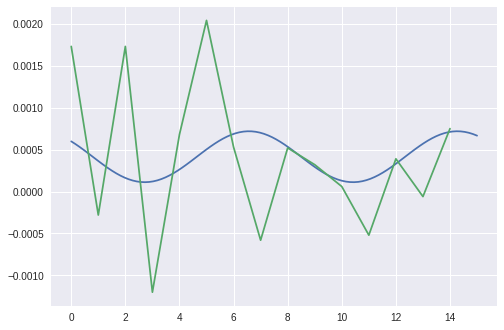

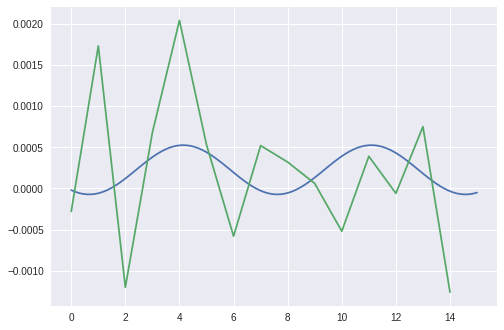

KeyError: ignored

In [20]:
f = fourier(df3,[15])
a = f.coeff[10]
b = f.coeff[15]
#print(a[170:190])

## Williams accumulation distribution

In [0]:
def wadl(prices,period):
    results = holder()
    dict = {}
    for i in range(0,len(period)):
        WAD = []
        for j in range(period[i],len(prices)):#-period[i]):
            TRH = np.array(prices.High.iloc[j],prices.Close.iloc[j-1]).max()
            TRL = np.array(prices.Low.iloc[j],prices.Close.iloc[j-1]).min()
            
            if prices.Close.iloc[j] > prices.Close.iloc[j-1]:
                PM = prices.Close.iloc[j] - TRL

            elif prices.Close.iloc[j] < prices.Close.iloc[j-1]:
                PM = prices.Close.iloc[j] - TRH
                
            elif prices.Close.iloc[j] == prices.Close.iloc[j-1]:
                PM = 0
            
            AD = PM * prices.Volume.iloc[j]
            
            WAD = np.append(WAD,AD)
        
        WAD = WAD.cumsum()
        
        WAD= pd.DataFrame(WAD,index=prices.iloc[period[i]:len(prices)].index)
        
        WAD.columns = [['WAD']]
        
        dict[period[i]] = WAD
        
    results.wadl = dict
    
    return results            

In [24]:
f = wadl(df3,[30])
a = f.wadl[30]
print(a[:10])

                            WAD
Date                           
2016-01-05 04:00:00    1.174208
2016-01-05 05:00:00    6.008348
2016-01-05 06:00:00    1.463579
2016-01-05 07:00:00  -16.667073
2016-01-05 08:00:00  -52.435538
2016-01-05 09:00:00  -87.925383
2016-01-05 10:00:00 -111.707850
2016-01-05 11:00:00 -125.143191
2016-01-05 12:00:00 -140.550777
2016-01-05 13:00:00 -162.487391


In [26]:
df4 = df3[10:200]
df4 = pd.concat([a, df4], axis=1)
df4.columns = [['WAD','Open','High','Low','Close','Volume']]
df4.head()
df4.fillna(method = 'ffill')
df4.fillna(method = 'bfill')
print(type(df4))
print(type(df1))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


## Above 100 you sell below 100 you buy

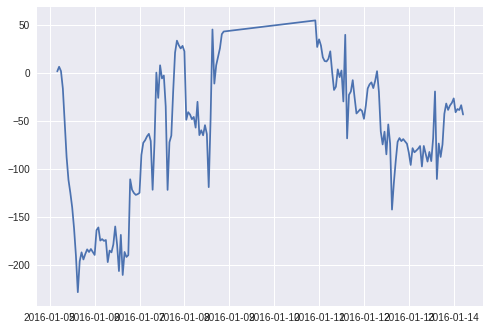

In [27]:
plt.plot(df4.WAD,label = 'WAD')
plt.figure(figsize=(16,9))
plt.show()

In [0]:
moving_avg = df.Close.rolling(center=False, window=20).mean()
trace_ma = go.Scatter(x=df.index,y=moving_avg)


In [0]:
def macd_func(prices , periods):
    results = holder()
    #rolling exponetial method
    EMA1 = prices.Close.ewm(span=periods[0]).mean()
    EMA2 = prices.Close.ewm(span=periods[1]).mean()
    
    macd = pd.DataFrame(EMA1 - EMA2)
    macd.columns = [['L']]
    
    sigMacd = macd.rolling(3).mean()
    sigMacd.columns = [['SL']]
    
    results.line = macd
    results.signal = sigMacd
    return results

In [30]:
#moving average convergenc divergence
macd_res = macd_func(df,[15,30])
res = macd_res.line

res = res.fillna(method='bfill')
temp= res.L.values
temp_df = pd.DataFrame(temp , index = res.index)
temp_df.columns = ['SL']
        
y7 = go.Ohlc(x=df.index, open = df.Open , close=df.Close,high=df.High,low= df.Low)
ma = df.Close.rolling(center=False, window=30).mean()
trace_ma = go.Scatter(x=res.index,y=moving_avg)
#data = [trace]
trace_macd = go.Scatter(x=res.index,y=temp_df.SL )
data = [y7 , trace_ma,trace_macd]
fig = tools.make_subplots(rows=3,cols=1,shared_xaxes = True,shared_yaxes = True)
fig.append_trace(y7,1,1)
fig.append_trace(trace_ma,2,1)
fig.append_trace(trace_macd,3,1)
py.offline.iplot(fig)
#plt.offline.iplot(fig , filename='forex_candlestick.html')

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



In [0]:
#price average method
def paavg(prices):
    results = holder()
    psavg = {}
    #for i in range(0,len(periods)):
    return pd.DataFrame(prices[['Low','High','Open','Close']].rolling(15).mean())
    
    #results.psavg = psavg
    #return results

In [32]:

avg = paavg(df)
#print(avg)
y7 = go.Ohlc(x=df.index, open = df.Open , close=df.Close,high=df.High,low= df.Low)
ma = df.Close.rolling(center=False, window=30).mean()
trace_ma = go.Scatter(x=df.index,y=moving_avg)
#data = [trace]
trace_avg = go.Scatter(x=avg.index,y=avg.Close )
data = [y7 , trace_ma,trace_avg]
fig = tools.make_subplots(rows=3,cols=1,shared_xaxes = True,shared_yaxes = True)
fig.append_trace(y7,1,1)
fig.append_trace(trace_ma,2,1)
fig.append_trace(trace_avg,3,1)
py.offline.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



In [36]:

df_train = df.copy()
#Relative Strength Index
#Avg(UP)/Avg(DOWN)+Avg(UP)*100
#The RSI will rise as the number and size of positive closes increase, 
#and it will fall as the number and size of losses increase
def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    #print(up,down)
    return 100 * up /up + down

# Momentum_1D = P(t) - P(t-1)
df_train['Momentum_1D'] = (df_train['Close']-df_train['Close'].shift(1)).fillna(0)
df_train['RSI_14D'] = df_train['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
df_train.head(100)

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D
Date,,,,,,,
2016-01-03 22:00:00,1.08730,1.08730,1.08659,1.08666,1485.9301,0.00000,0.000000
2016-01-03 23:00:00,1.08665,1.08665,1.08451,1.08516,4071.6499,-0.00150,0.000000
2016-01-04 00:00:00,1.08515,1.08577,1.08431,1.08453,4182.2402,-0.00063,0.000000
2016-01-04 01:00:00,1.08453,1.08616,1.08272,1.08599,6970.7100,0.00146,0.000000
2016-01-04 02:00:00,1.08597,1.08756,1.08582,1.08714,6419.8901,0.00115,0.000000
2016-01-04 03:00:00,1.08716,1.08728,1.08670,1.08712,3703.3799,-0.00002,0.000000
2016-01-04 04:00:00,1.08713,1.08833,1.08694,1.08791,4588.3901,0.00079,0.000000
2016-01-04 05:00:00,1.08793,1.09047,1.08741,1.08974,6686.0200,0.00183,0.000000
2016-01-04 06:00:00,1.08973,1.09025,1.08841,1.08890,5422.6099,-0.00084,0.000000


In [37]:
#Price Volume Trend
#farmula (((CurrentClose - PreviousClose)/PreviousClose)*volume)+previouspvt

df_train["PVT"] = ((df_train['Close'] -  df_train['Close'].shift(1))/df_train['Close'].shift(1))*df_train['Volume']
df_train['PVT'] = df_train['PVT'] - df_train['PVT'].shift(1)
df_train['PVT'] = df_train['PVT'].fillna(0)
df_train.head()

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT
Date,,,,,,,,
2016-01-03 22:00:00,1.08730,1.08730,1.08659,1.08666,1485.9301,0.00000,0.0,0.000000
2016-01-03 23:00:00,1.08665,1.08665,1.08451,1.08516,4071.6499,-0.00150,0.0,0.000000
2016-01-04 00:00:00,1.08515,1.08577,1.08431,1.08453,4182.2402,-0.00063,0.0,3.192371
2016-01-04 01:00:00,1.08453,1.08616,1.08272,1.08599,6970.7100,0.00146,0.0,11.812046
2016-01-04 02:00:00,1.08597,1.08756,1.08582,1.08714,6419.8901,0.00115,0.0,-2.585718


In [0]:
#upper,lower, avg = boolinger(df_train , 30)
#print(type(upper))
df_train['BB_Upper'],df_train['BB_Lower'],df_train['BB_Middle'] = boolinger(df_train , 30)

In [0]:
df_train.tail()

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle
Date,,,,,,,,,,,
2018.11.06,0.72086,0.72454,0.72043,0.72433,75106,0.00347,100.002350,207.405293,0.725514,0.700305,0.712909
2018.11.07,0.72439,0.72990,0.72122,0.72732,92135,0.00299,100.002484,18.791567,0.725749,0.700156,0.712952
2018.11.08,0.72732,0.73015,0.72463,0.72555,88340,-0.00177,100.002365,-595.312426,0.726319,0.699847,0.713083
2018.11.09,0.72555,0.72694,0.72183,0.72221,89665,-0.00334,100.002322,-197.780747,0.726354,0.699830,0.713092
2018.11.12,0.72186,0.72367,0.71866,0.71974,72031,-0.00247,100.002343,166.414059,0.726085,0.699944,0.713015


In [47]:
df_train.drop(['Momentum_1D'],axis =1)
df_train.head()

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle,ROC,MACD_Line,MACD_SLine,EMA,TEMA
Date,,,,,,,,,,,,,,,,
2016-01-03 22:00:00,1.08730,1.08730,1.08659,1.08666,1485.9301,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,1.086660,1.000651
2016-01-03 23:00:00,1.08665,1.08665,1.08451,1.08516,4071.6499,-0.00150,0.0,0.000000,0.0,0.0,0.0,0.0,-0.000025,0.000000,1.085660,1.000629
2016-01-04 00:00:00,1.08515,1.08577,1.08431,1.08453,4182.2402,-0.00063,0.0,3.192371,0.0,0.0,0.0,0.0,-0.000047,-0.000024,1.085014,1.000614
2016-01-04 01:00:00,1.08453,1.08616,1.08272,1.08599,6970.7100,0.00146,0.0,11.812046,0.0,0.0,0.0,0.0,-0.000017,-0.000029,1.085535,1.000626
2016-01-04 02:00:00,1.08597,1.08756,1.08582,1.08714,6419.8901,0.00115,0.0,-2.585718,0.0,0.0,0.0,0.0,0.000033,-0.000010,1.086363,1.000644


In [48]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100

df_train['ROC'] = ((df_train['Close'] - df_train['Close'].shift(12))/(df_train['Close'].shift(12)))*100
df_train = df_train.fillna(0)
df_train.tail()

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle,ROC,MACD_Line,MACD_SLine,EMA,TEMA
Date,,,,,,,,,,,,,,,,
2018-11-30 17:00:00,1.13212,1.13259,1.13110,1.13148,14184.7402,-0.00065,100.000733,-4.597169,1.142077,1.132989,1.137533,-0.674181,-0.000850,-0.000610,1.132202,1.002311
2018-11-30 18:00:00,1.13146,1.13156,1.13054,1.13145,13979.0898,-0.00003,100.000713,7.773372,1.142327,1.132259,1.137293,-0.668967,-0.001039,-0.000834,1.131826,1.002291
2018-11-30 19:00:00,1.13145,1.13161,1.13086,1.13089,10084.9502,-0.00056,100.000750,-4.620806,1.142635,1.131533,1.137084,-0.634385,-0.001220,-0.001036,1.131358,1.002267
2018-11-30 20:00:00,1.13095,1.13217,1.13079,1.13215,7344.9902,0.00126,100.000810,13.174990,1.142687,1.131066,1.136876,-0.577837,-0.001281,-0.001180,1.131754,1.002287
2018-11-30 21:00:00,1.13216,1.13221,1.13131,1.13164,4509.7202,-0.00051,100.000769,-10.215039,1.142717,1.130569,1.136643,-0.476668,-0.001352,-0.001284,1.131697,1.002284


In [0]:
result = macd_func(df_train , [15,30])
df_train['MACD_Line'] = result.line
df_train['MACD_SLine'] = result.signal

In [0]:
df_train.tail()
#df_train.drop('Momentum_1D' ,'Open' ,'High','BB_Upper' ,'BB_Lower'.'HAOpen' , 'HAHigh' , 'HALow',axis=1)

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle,ROC,MACD_Line,MACD_SLine
Date,,,,,,,,,,,,,,
2018.11.06,0.72086,0.72454,0.72043,0.72433,75106,0.00347,100.002350,207.405293,0.725514,0.700305,0.712909,1.794648,-0.000239,-0.000951
2018.11.07,0.72439,0.72990,0.72122,0.72732,92135,0.00299,100.002484,18.791567,0.725749,0.700156,0.712952,2.734618,0.000554,-0.000223
2018.11.08,0.72732,0.73015,0.72463,0.72555,88340,-0.00177,100.002365,-595.312426,0.726319,0.699847,0.713083,2.426732,0.001091,0.000469
2018.11.09,0.72555,0.72694,0.72183,0.72221,89665,-0.00334,100.002322,-197.780747,0.726354,0.699830,0.713092,2.325021,0.001320,0.000988
2018.11.12,0.72186,0.72367,0.71866,0.71974,72031,-0.00247,100.002343,166.414059,0.726085,0.699944,0.713015,1.673989,0.001348,0.001253


In [50]:
#Triple Exponential MA Formula:
#T-EMA = (3EMA – 3EMA(EMA)) + EMA(EMA(EMA))
#Where:
#EMA = EMA(1) + α * (Close – EMA(1))
#α = 2 / (N + 1)
#N = The smoothing period.

df_train['EMA'] = df_train['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
df_train = df_train.fillna(0)


df_train['TEMA'] = (3 * df_train['EMA'] - 3 * df_train['EMA'] * df_train['EMA']) + (df_train['EMA']*df_train['EMA']*df_train['EMA'])
df_train.tail()

,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle,ROC,MACD_Line,MACD_SLine,EMA,TEMA
Date,,,,,,,,,,,,,,,,
2018-11-30 17:00:00,1.13212,1.13259,1.13110,1.13148,14184.7402,-0.00065,100.000733,-4.597169,1.142077,1.132989,1.137533,-0.674181,-0.000850,-0.000610,1.132202,1.002311
2018-11-30 18:00:00,1.13146,1.13156,1.13054,1.13145,13979.0898,-0.00003,100.000713,7.773372,1.142327,1.132259,1.137293,-0.668967,-0.001039,-0.000834,1.131826,1.002291
2018-11-30 19:00:00,1.13145,1.13161,1.13086,1.13089,10084.9502,-0.00056,100.000750,-4.620806,1.142635,1.131533,1.137084,-0.634385,-0.001220,-0.001036,1.131358,1.002267
2018-11-30 20:00:00,1.13095,1.13217,1.13079,1.13215,7344.9902,0.00126,100.000810,13.174990,1.142687,1.131066,1.136876,-0.577837,-0.001281,-0.001180,1.131754,1.002287
2018-11-30 21:00:00,1.13216,1.13221,1.13131,1.13164,4509.7202,-0.00051,100.000769,-10.215039,1.142717,1.130569,1.136643,-0.476668,-0.001352,-0.001284,1.131697,1.002284


In [0]:
temp_df = highkenashi(df_train, [15])

In [0]:
df_train['HAOpen'] = temp_df.Open
df_train['HAClose'] = temp_df.Close
df_train['HALow'] = temp_df.Low
df_train['HAHigh'] = temp_df.High

In [46]:
df_train.head()


,Open,High,Low,Close,Volume,Momentum_1D,RSI_14D,PVT,BB_Upper,BB_Lower,BB_Middle,ROC,MACD_Line,MACD_SLine,EMA,TEMA
Date,,,,,,,,,,,,,,,,
2016-01-03 22:00:00,1.08730,1.08730,1.08659,1.08666,1485.9301,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,1.086660,1.000651
2016-01-03 23:00:00,1.08665,1.08665,1.08451,1.08516,4071.6499,-0.00150,0.0,0.000000,0.0,0.0,0.0,0.0,-0.000025,0.000000,1.085660,1.000629
2016-01-04 00:00:00,1.08515,1.08577,1.08431,1.08453,4182.2402,-0.00063,0.0,3.192371,0.0,0.0,0.0,0.0,-0.000047,-0.000024,1.085014,1.000614
2016-01-04 01:00:00,1.08453,1.08616,1.08272,1.08599,6970.7100,0.00146,0.0,11.812046,0.0,0.0,0.0,0.0,-0.000017,-0.000029,1.085535,1.000626
2016-01-04 02:00:00,1.08597,1.08756,1.08582,1.08714,6419.8901,0.00115,0.0,-2.585718,0.0,0.0,0.0,0.0,0.000033,-0.000010,1.086363,1.000644


In [0]:
#if closing price is increasing or 0 then add 1 else 0 in label column
def add_label(df):
    idx = len(df.columns)
    new_col = np.where(df['Close'] >= df['Close'].shift(1), 1, 0)  
    df.insert(loc=idx, column='Label', value=new_col)
    df = df.fillna(0)
add_label(df_train)

In [0]:
#importing required libraries


In [58]:
times = sorted(df_train.index.values)  # get the times
last_5pct = sorted(df_train.index.values)[-int(0.20*len(times))]
df_train.drop(['Open' , 'BB_Upper','BB_Lower' ,'Low' ,'High' ,'HAHigh','HAOpen' ,'HALow','Open','Momentum_1D'] , axis=1 ,inplace=True)
#df_train.drop(['Volume','BB_Middle' 'MACD_Line' ] , axis=1 ,inplace=True)
validation_df = df_train[(df_train.index >= last_5pct)]  # make the validation data where the index is in the last 5%
train_df = df_train[(df_train.index < last_5pct)]  # now the main_df is all the data up to the last 5%
#dataset = df_train.values
#train = dataset[0:1000,:]
#valid = dataset[1000:,:]
#train_df
#converting dataset into x_train and y_train
#scaler = MinMaxScaler(feature_range=(0, 1))
#scaled_data = scaler.fit_transform(dataset)
#scaled_data


ValueError: ignored

In [54]:
df_train.head()

,Close,Volume,RSI_14D,PVT,BB_Middle,ROC,MACD_Line,MACD_SLine,EMA,TEMA,HAClose,Label
Date,,,,,,,,,,,,
2016-01-03 22:00:00,1.08666,1485.9301,0.0,0.000000,0.0,0.0,0.000000,0.000000,1.086660,1.000651,1.086963,0
2016-01-03 23:00:00,1.08516,4071.6499,0.0,0.000000,0.0,0.0,-0.000025,0.000000,1.085660,1.000629,1.085743,0
2016-01-04 00:00:00,1.08453,4182.2402,0.0,3.192371,0.0,0.0,-0.000047,-0.000024,1.085014,1.000614,1.084940,0
2016-01-04 01:00:00,1.08599,6970.7100,0.0,11.812046,0.0,0.0,-0.000017,-0.000029,1.085535,1.000626,1.084850,1
2016-01-04 02:00:00,1.08714,6419.8901,0.0,-2.585718,0.0,0.0,0.000033,-0.000010,1.086363,1.000644,1.086623,1


In [0]:

import random
def preprocess(preproces):
    
    for col in preproces.columns:
        if col != "Label": #normalize all columns except the traget
            #df.dropna(inplace=True)
            preproces[col] = preprocessing.scale(preproces[col].values) #scale between 0,1
    
    preproces.dropna(inplace=True)
    sequential_data = []  #this will contain all the sequence we will create
    prev_days = deque(maxlen = SEQ_LEN)  #the actual sequence which will be used for prediction and made with deque method using our preecding sequnce length
    
    for i in preproces.values:
        prev_days.append([n for n in i[:-1]]) #store values for specified period
        if(len(prev_days) == SEQ_LEN):
            sequential_data.append([np.array(prev_days), i[-1]])
    #print(temp) #drop any nan values as in currency they gives you a headache
    random.shuffle(sequential_data)
    #print(len(sequential_data))
    X = []
    y = []

    for seq, target in sequential_data:  # going over our new sequential data
        X.append(seq)  # X is the sequences
        y.append(target)  # y is the targets/labels 

    return np.array(X), y  # return X and y...and make X a numpy array!

In [60]:
#preprocess(train_df)
train_X, train_Y = preprocess(train_df)
#print(train_Y)
valid_X, valid_Y = preprocess(validation_df)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-ve

In [61]:

sgd = optimizers.SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)

model = Sequential()
model.add(LSTM(128, input_shape=(train_X.shape[1:]), return_sequences=True))
model.add(Dropout(0.2))
model.add(BatchNormalization())

#model.add(LSTM(128, return_sequences=True))
#model.add(Dropout(0.1))
#model.add(BatchNormalization())

model.add(LSTM(128))
model.add(Dropout(0.2))
model.add(BatchNormalization())

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(2, activation='softmax'))


opt = tf.keras.optimizers.Adam(lr=0.001, decay=1e-6)

# Compile model
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer = sgd,
    metrics=['accuracy']
)



# Train model
history = model.fit(
    train_X, train_Y,
    batch_size=16,
    epochs=10,
    validation_data=(valid_X, valid_Y),
)

Train on 14502 samples, validate on 3581 samples
Epoch 1/10
14502/14502 [==============================] - 131s 9ms/step - loss: 0.7138 - acc: 0.4979 - val_loss: 0.6939 - val_acc: 0.5077
Epoch 2/10
14502/14502 [==============================] - 130s 9ms/step - loss: 0.6990 - acc: 0.4961 - val_loss: 0.6991 - val_acc: 0.4873
Epoch 3/10
14502/14502 [==============================] - 131s 9ms/step - loss: 0.6978 - acc: 0.4998 - val_loss: 0.6933 - val_acc: 0.5032
Epoch 4/10
14502/14502 [==============================] - 130s 9ms/step - loss: 0.6762 - acc: 0.5430 - val_loss: 0.6353 - val_acc: 0.5923
Epoch 5/10
14502/14502 [==============================] - 130s 9ms/step - loss: 0.5964 - acc: 0.6498 - val_loss: 0.6638 - val_acc: 0.6431
Epoch 6/10
14502/14502 [==============================] - 130s 9ms/step - loss: 0.5558 - acc: 0.6748 - val_loss: 0.4754 - val_acc: 0.7328
Epoch 7/10
14502/14502 [==============================] - 131s 9ms/step - loss: 0.4772 - acc: 0.7636 - val_loss: 0.3358 - v

In [0]:
#print(history.history['acc'])

In [67]:
#creating dataframe for prediting value based on only closed value of the dataset without scaling and any other parameters.
data = df1.sort_index(ascending=True, axis=0)
new_data = pd.DataFrame(index=range(0,len(df1)),columns=['Date', 'Close'])
for i in range(0,len(data)):
    new_data['Date'][i] = data['Date'][i]
    new_data['Close'][i] = data['Close'][i]

#setting index
new_data.index = new_data.Date
new_data.drop('Date', axis=1, inplace=True)

#creating train and test sets
dataset = new_data.values

train = dataset[0:1000,:]
valid = dataset[1000:,:]

#converting dataset into x_train and y_train
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset)

x_train, y_train = [], []
for i in range(30,len(train)):
    x_train.append(scaled_data[i-30:i,0])
    y_train.append(scaled_data[i,0])
x_train, y_train = np.array(x_train), np.array(y_train)

x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1],1)))
model.add(LSTM(units=50))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(x_train, y_train, epochs=1, batch_size=1, verbose=2)

#predicting next values, using past 60 from the train data
inputs = new_data[len(new_data) - len(valid) - 30:].values
inputs = inputs.reshape(-1,1)
inputs  = scaler.transform(inputs)

X_test = []
for i in range(30,inputs.shape[0]):
    X_test.append(inputs[i-30:i,0])
X_test = np.array(X_test)

X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
closing_price = model.predict(X_test)
closing_price = scaler.inverse_transform(closing_price)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype object was converted to float64 by MinMaxScaler.



Epoch 1/1
 - 32s - loss: 0.0011


In [68]:
rms=np.sqrt(np.mean(np.power((closing_price),2)))
rms

1.1366688

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



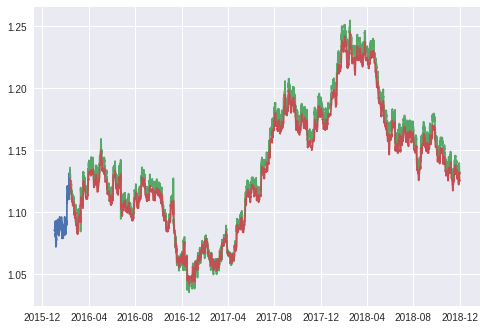

In [69]:

#for plotting
trainX = new_data[:1000]
validX = new_data[1000:]
validX['Predictions'] = closing_price

plt.plot(trainX['Close'])
plt.plot(validX[['Close','Predictions']])